In [1]:
%load_ext autoreload
%autoreload 2

import preprocessing


df_raw = preprocessing.read_dataset("scaled_data.rds")


In [10]:
import polars as pl
print(df_raw.null_count())
df = preprocessing.preprocess(df_raw)
print(df.null_count())
print(df.columns)
df

shape: (1, 18)
┌────────┬───────┬──────┬──────┬───┬─────┬─────┬───────┬──────┐
│ Mallin ┆ Dates ┆ Evap ┆ NDVI ┆ … ┆ Cat ┆ Day ┆ Month ┆ Year │
│ ---    ┆ ---   ┆ ---  ┆ ---  ┆   ┆ --- ┆ --- ┆ ---   ┆ ---  │
│ u32    ┆ u32   ┆ u32  ┆ u32  ┆   ┆ u32 ┆ u32 ┆ u32   ┆ u32  │
╞════════╪═══════╪══════╪══════╪═══╪═════╪═════╪═══════╪══════╡
│ 0      ┆ 0     ┆ 0    ┆ 0    ┆ … ┆ 0   ┆ 0   ┆ 0     ┆ 0    │
└────────┴───────┴──────┴──────┴───┴─────┴─────┴───────┴──────┘
shape: (1, 23)
┌────────┬───────┬──────┬──────┬───┬───────┬──────┬──────────┬─────┐
│ Mallin ┆ Dates ┆ Evap ┆ NDVI ┆ … ┆ month ┆ year ┆ year_str ┆ id  │
│ ---    ┆ ---   ┆ ---  ┆ ---  ┆   ┆ ---   ┆ ---  ┆ ---      ┆ --- │
│ u32    ┆ u32   ┆ u32  ┆ u32  ┆   ┆ u32   ┆ u32  ┆ u32      ┆ u32 │
╞════════╪═══════╪══════╪══════╪═══╪═══════╪══════╪══════════╪═════╡
│ 0      ┆ 0     ┆ 0    ┆ 0    ┆ … ┆ 0     ┆ 0    ┆ 0        ┆ 0   │
└────────┴───────┴──────┴──────┴───┴───────┴──────┴──────────┴─────┘
['Mallin', 'Dates', 'Evap', 'NDVI', 'PP

Mallin,Dates,Evap,NDVI,PP,Rain_Days,Snow,Snow_Days,Tmax,Tmax_max,Tmin,Tmin_min,Lat,Lon,Cat,Day,Month,Year,day,month,year,year_str,id
str,date,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,i32,f64,f64,i16,i8,i32,str,str
"""Mallin01""",2001-01-01,-1.62218,0.610736,0.816361,0.272727,-0.011728,0.0,-1.141096,0.227225,-0.47655,-0.338386,-39.68764,-71.03597,1.0,1,1.0,2001.0,1,1,2001,"""2001""","""Mallin01-2001"""
"""Mallin01""",2001-01-17,-2.304308,1.172737,0.416009,0.272727,0.002531,0.0,-1.806795,-0.816162,-1.086345,-0.951014,-39.68764,-71.03597,1.0,17,1.0,2001.0,17,1,2001,"""2001""","""Mallin01-2001"""
"""Mallin01""",2001-02-02,-0.64113,0.56219,0.589108,0.181818,0.002111,0.0,-1.50428,-0.53708,-1.444662,-1.09116,-39.68764,-71.03597,1.0,2,2.0,2001.0,33,2,2001,"""2001""","""Mallin01-2001"""
"""Mallin01""",2001-02-18,-2.803338,0.19666,0.000378,0.090909,0.002029,0.0,0.076931,0.102736,-1.275896,-1.01882,-39.68764,-71.03597,1.0,18,2.0,2001.0,49,2,2001,"""2001""","""Mallin01-2001"""
"""Mallin01""",2001-03-06,0.83369,0.988417,-0.371276,0.0,-0.005684,0.0,-0.270337,0.788329,-0.976413,0.297598,-39.68764,-71.03597,1.0,6,3.0,2001.0,65,3,2001,"""2001""","""Mallin01-2001"""
…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…
"""Mallin10""",2024-10-15,0.377692,0.446619,-0.683142,0.125,-0.333064,0.0,0.757088,-0.256488,0.319685,0.100256,-38.90979,-70.04698,3.0,15,10.0,2024.0,289,10,2024,"""2024""","""Mallin10-2024"""
"""Mallin10""",2024-10-31,1.311498,0.46444,-0.769485,0.0,-0.225614,0.0,2.873201,1.860431,2.237986,1.574457,-38.90979,-70.04698,3.0,31,10.0,2024.0,305,10,2024,"""2024""","""Mallin10-2024"""
"""Mallin10""",2024-11-16,1.052606,0.838022,-0.302676,0.125,-0.126133,0.0,0.132599,0.226712,0.252023,-0.101379,-38.90979,-70.04698,3.0,16,11.0,2024.0,321,11,2024,"""2024""","""Mallin10-2024"""


In [3]:
count_per_year=df.group_by(["Mallin","year"]).len().sort(pl.col("len"))

count_per_year.transpose()
#count_per_year.select([pl.col("len").unique_counts()])


column_0,column_1,column_2,column_3,column_4,column_5,column_6,column_7,column_8,column_9,column_10,column_11,column_12,column_13,column_14,column_15,column_16,column_17,column_18,column_19,column_20,column_21,column_22,column_23,column_24,column_25,column_26,column_27,column_28,column_29,column_30,column_31,column_32,column_33,column_34,column_35,column_36,…,column_203,column_204,column_205,column_206,column_207,column_208,column_209,column_210,column_211,column_212,column_213,column_214,column_215,column_216,column_217,column_218,column_219,column_220,column_221,column_222,column_223,column_224,column_225,column_226,column_227,column_228,column_229,column_230,column_231,column_232,column_233,column_234,column_235,column_236,column_237,column_238,column_239
str,str,str,str,str,str,str,str,str,str,str,str,str,str,str,str,str,str,str,str,str,str,str,str,str,str,str,str,str,str,str,str,str,str,str,str,str,…,str,str,str,str,str,str,str,str,str,str,str,str,str,str,str,str,str,str,str,str,str,str,str,str,str,str,str,str,str,str,str,str,str,str,str,str,str
"""Mallin05""","""Mallin04""","""Mallin07""","""Mallin03""","""Mallin01""","""Mallin10""","""Mallin10""","""Mallin08""","""Mallin01""","""Mallin01""","""Mallin02""","""Mallin01""","""Mallin09""","""Mallin09""","""Mallin07""","""Mallin09""","""Mallin04""","""Mallin05""","""Mallin07""","""Mallin03""","""Mallin07""","""Mallin10""","""Mallin06""","""Mallin10""","""Mallin09""","""Mallin02""","""Mallin09""","""Mallin06""","""Mallin08""","""Mallin05""","""Mallin01""","""Mallin05""","""Mallin09""","""Mallin03""","""Mallin03""","""Mallin09""","""Mallin02""",…,"""Mallin02""","""Mallin08""","""Mallin07""","""Mallin05""","""Mallin05""","""Mallin08""","""Mallin10""","""Mallin03""","""Mallin10""","""Mallin06""","""Mallin05""","""Mallin06""","""Mallin08""","""Mallin06""","""Mallin09""","""Mallin04""","""Mallin06""","""Mallin07""","""Mallin05""","""Mallin07""","""Mallin05""","""Mallin06""","""Mallin06""","""Mallin01""","""Mallin09""","""Mallin08""","""Mallin05""","""Mallin03""","""Mallin02""","""Mallin09""","""Mallin05""","""Mallin06""","""Mallin03""","""Mallin06""","""Mallin05""","""Mallin02""","""Mallin10"""
"""2024""","""2004""","""2004""","""2013""","""2022""","""2020""","""2002""","""2008""","""2008""","""2003""","""2003""","""2010""","""2023""","""2009""","""2010""","""2005""","""2011""","""2004""","""2018""","""2006""","""2016""","""2011""","""2008""","""2007""","""2016""","""2019""","""2007""","""2009""","""2020""","""2008""","""2023""","""2011""","""2006""","""2003""","""2015""","""2018""","""2014""",…,"""2009""","""2011""","""2006""","""2022""","""2007""","""2013""","""2017""","""2021""","""2006""","""2007""","""2021""","""2002""","""2017""","""2023""","""2002""","""2018""","""2005""","""2021""","""2010""","""2022""","""2020""","""2018""","""2019""","""2018""","""2012""","""2002""","""2023""","""2012""","""2010""","""2008""","""2018""","""2001""","""2014""","""2024""","""2002""","""2023""","""2013"""
"""23""","""23""","""23""","""23""","""23""","""23""","""23""","""23""","""23""","""23""","""23""","""23""","""23""","""23""","""23""","""23""","""23""","""23""","""23""","""23""","""23""","""23""","""23""","""23""","""23""","""23""","""23""","""23""","""23""","""23""","""23""","""23""","""23""","""23""","""23""","""23""","""23""",…,"""23""","""23""","""23""","""23""","""23""","""23""","""23""","""23""","""23""","""23""","""23""","""23""","""23""","""23""","""23""","""23""","""23""","""23""","""23""","""23""","""23""","""23""","""23""","""23""","""23""","""23""","""23""","""23""","""23""","""23""","""23""","""23""","""23""","""23""","""23""","""23""","""23"""


# Explore each Mallin w/preprocessing

/home/facundoq/dev/mallin/.venv/lib/python3.12/site-packages/mizani/breaks.py:448: FutureWarning: Passing the width as the parameter has been deprecated and will not work in a future version. Use breaks_date(width="4 years")


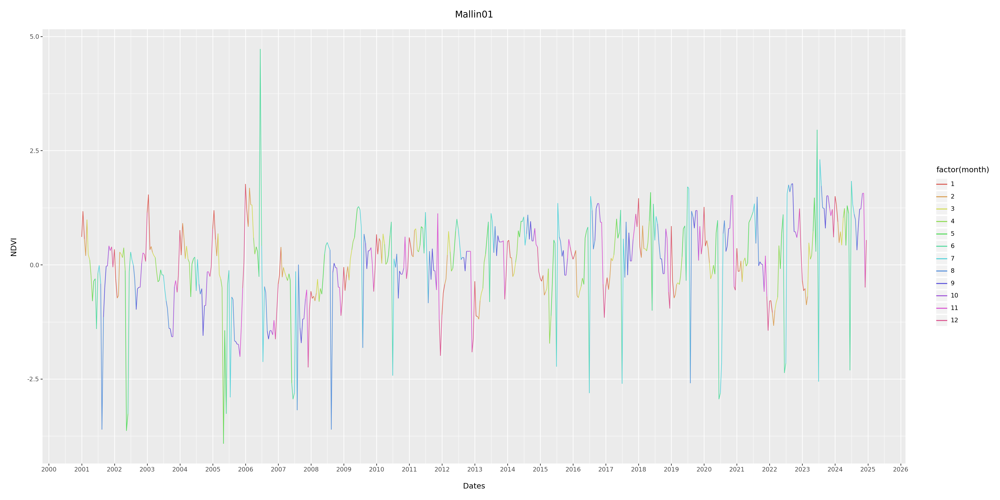

/home/facundoq/dev/mallin/.venv/lib/python3.12/site-packages/mizani/breaks.py:448: FutureWarning: Passing the width as the parameter has been deprecated and will not work in a future version. Use breaks_date(width="4 years")


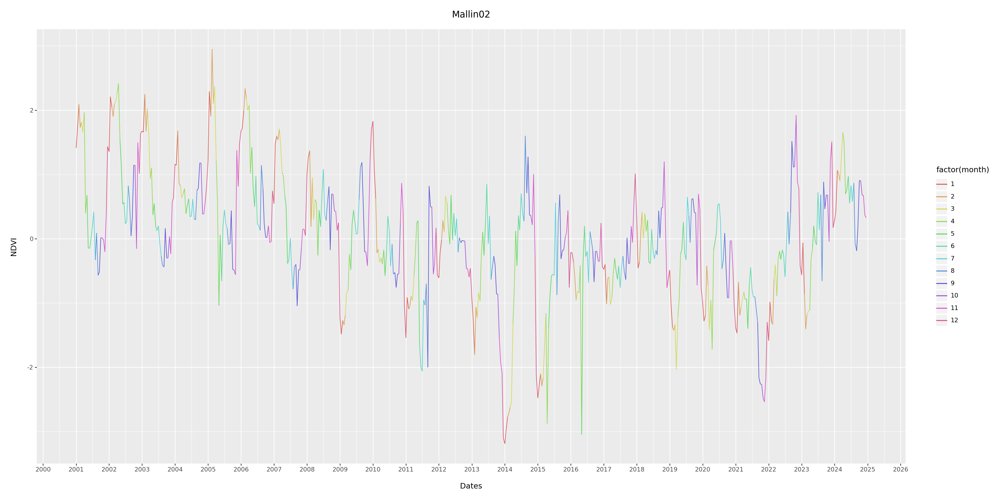

/home/facundoq/dev/mallin/.venv/lib/python3.12/site-packages/mizani/breaks.py:448: FutureWarning: Passing the width as the parameter has been deprecated and will not work in a future version. Use breaks_date(width="4 years")


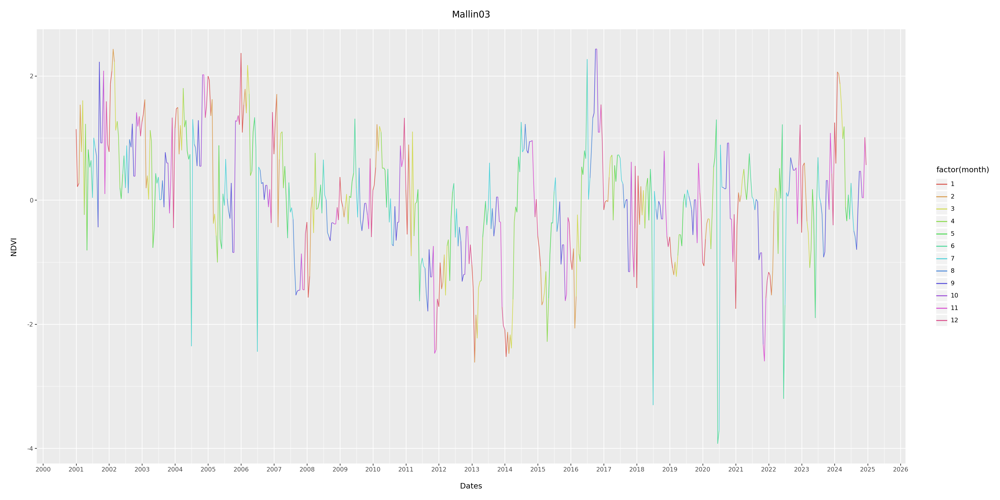

/home/facundoq/dev/mallin/.venv/lib/python3.12/site-packages/mizani/breaks.py:448: FutureWarning: Passing the width as the parameter has been deprecated and will not work in a future version. Use breaks_date(width="4 years")


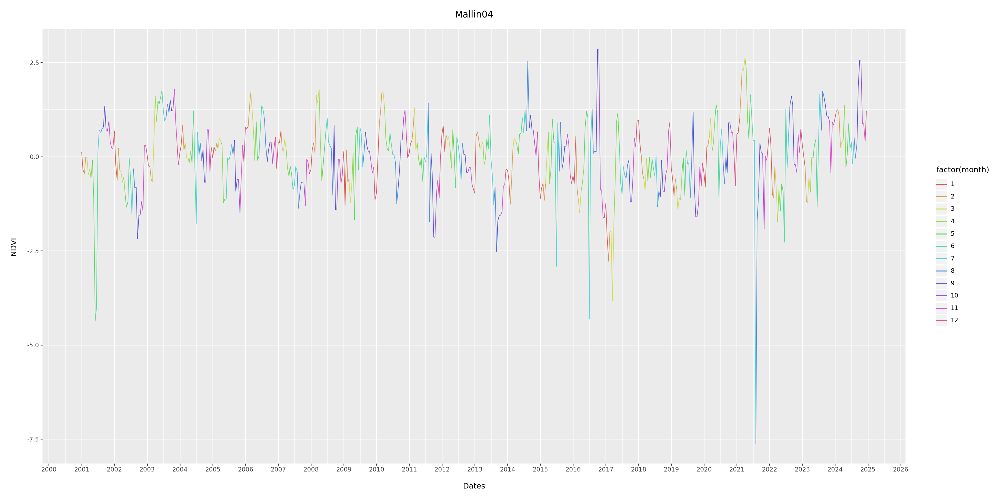

/home/facundoq/dev/mallin/.venv/lib/python3.12/site-packages/mizani/breaks.py:448: FutureWarning: Passing the width as the parameter has been deprecated and will not work in a future version. Use breaks_date(width="4 years")


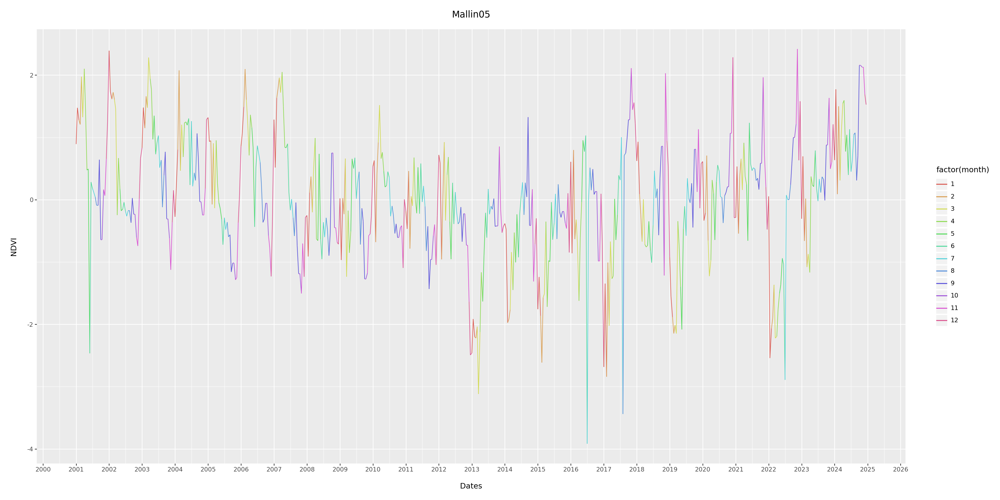

/home/facundoq/dev/mallin/.venv/lib/python3.12/site-packages/mizani/breaks.py:448: FutureWarning: Passing the width as the parameter has been deprecated and will not work in a future version. Use breaks_date(width="4 years")


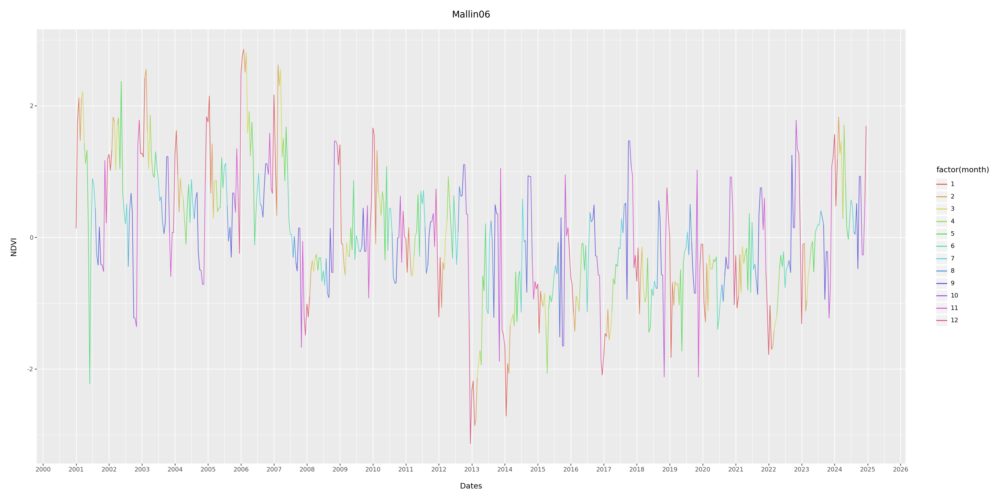

/home/facundoq/dev/mallin/.venv/lib/python3.12/site-packages/mizani/breaks.py:448: FutureWarning: Passing the width as the parameter has been deprecated and will not work in a future version. Use breaks_date(width="4 years")


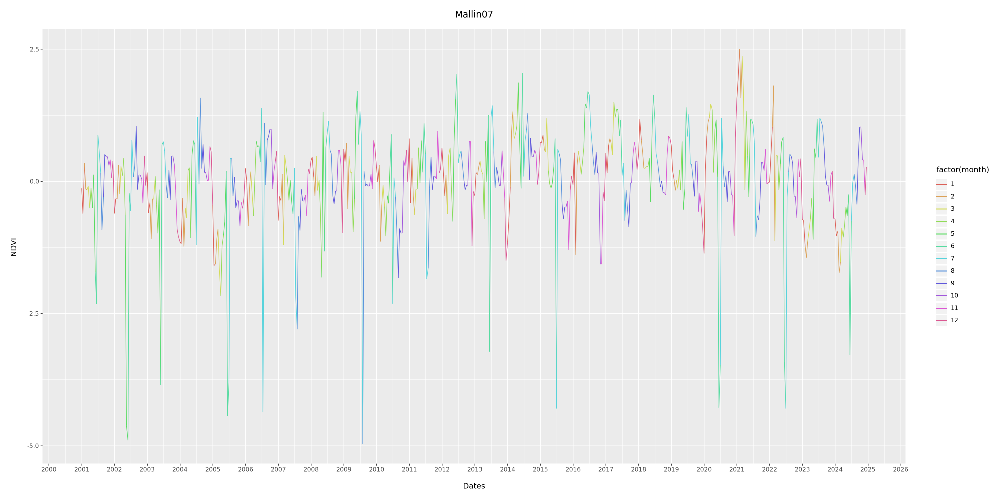

/home/facundoq/dev/mallin/.venv/lib/python3.12/site-packages/mizani/breaks.py:448: FutureWarning: Passing the width as the parameter has been deprecated and will not work in a future version. Use breaks_date(width="4 years")


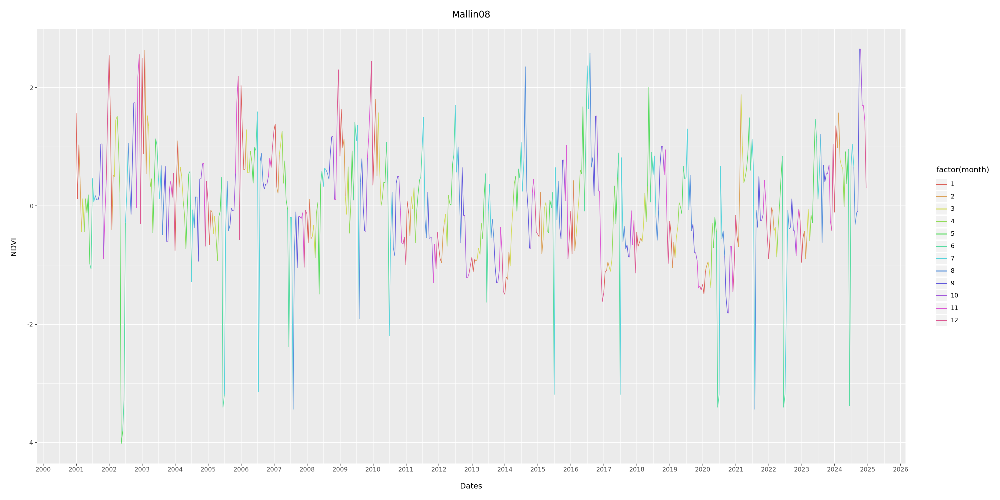

/home/facundoq/dev/mallin/.venv/lib/python3.12/site-packages/mizani/breaks.py:448: FutureWarning: Passing the width as the parameter has been deprecated and will not work in a future version. Use breaks_date(width="4 years")


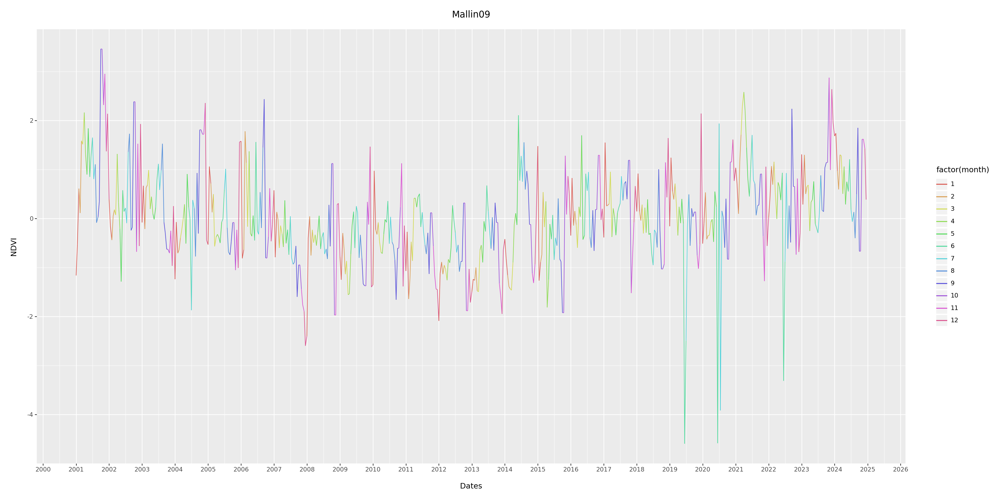

/home/facundoq/dev/mallin/.venv/lib/python3.12/site-packages/mizani/breaks.py:448: FutureWarning: Passing the width as the parameter has been deprecated and will not work in a future version. Use breaks_date(width="4 years")


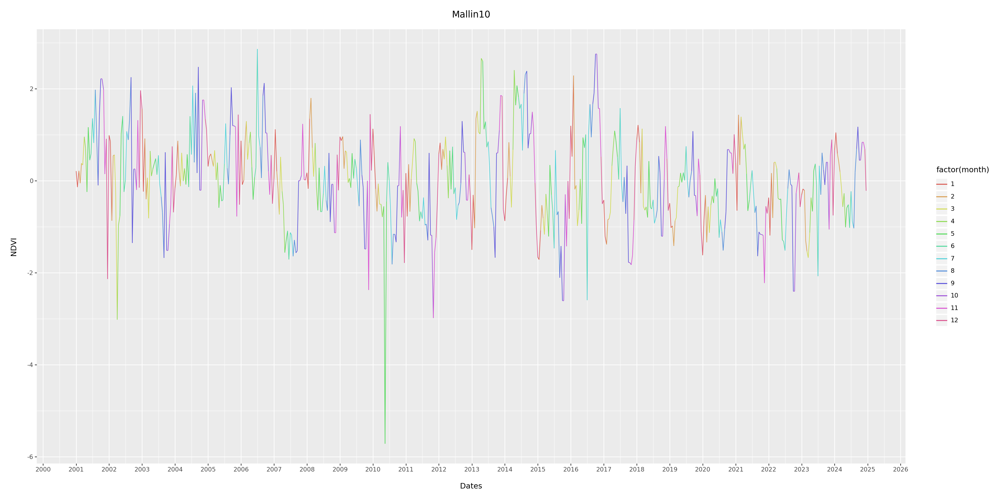

In [80]:
import plotnine as gg
import darts as ds
import pandas as pd
from mizani.breaks import date_breaks
from mizani.formatters import date_format

for mallin in range(1,11):
    mallin_id =f"Mallin{mallin:02d}"
    pdf = preprocessing.get_mallin_timeseries_pd(df,mallin_id)
    pdf['Dates'] = pdf.index

    (
        gg.ggplot(pdf,gg.aes(x="Dates",y="NDVI"))
        +gg.geom_line(gg.aes(color="factor(month)",group=None))
        + gg.scale_x_datetime(breaks=date_breaks("1 years"),labels=date_format("%Y"))  # new
        +gg.ggtitle(mallin_id)
        +gg.theme(figure_size=(20,10))

    ).show()

# Per year trends 

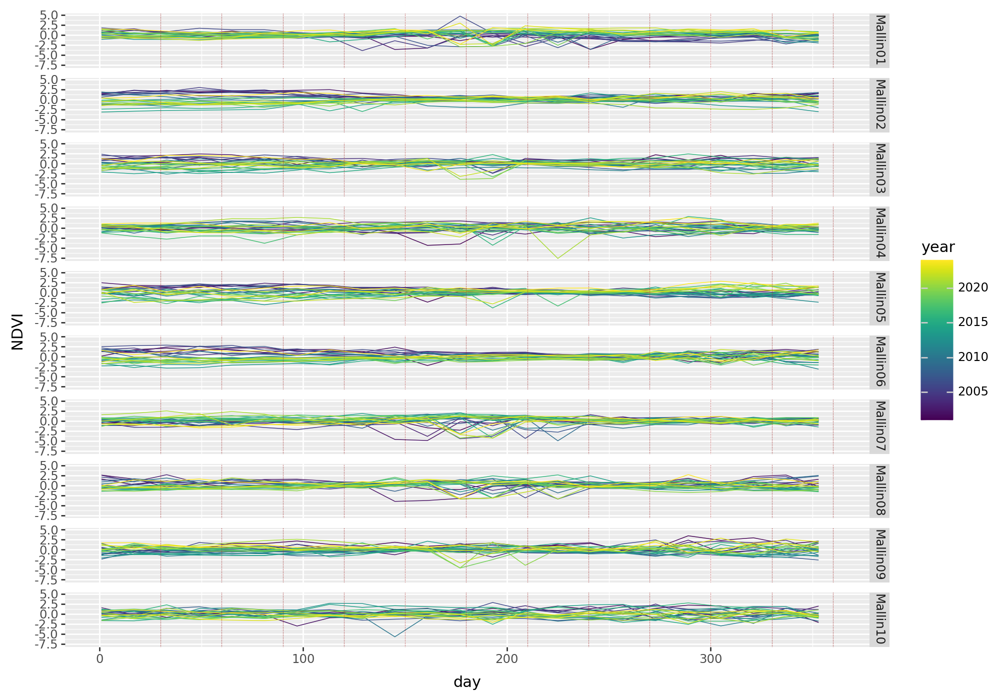

In [69]:

(
    gg.ggplot(df, gg.aes(x='day', y="NDVI",color="year",group="year"))
    + gg.geom_line(size=0.3)
    + gg.geom_vline(xintercept=[i*30 for i in range(1,13)],color="brown", size=0.25,linetype="dotted")  
    + gg.theme(figure_size=(10, 7))
    +gg.facet_grid("Mallin") 
).show()


# Global Trends

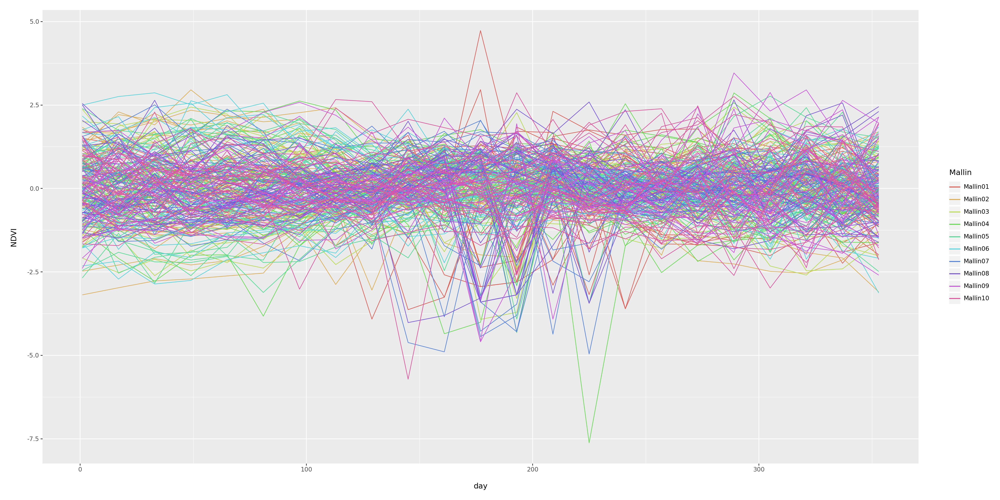

In [ ]:
(gg.ggplot(df)
    + gg.geom_line(gg.aes(x='day', y="NDVI", group="id",color="Mallin"))
    + gg.theme(figure_size=(20, 10))
).show()




# Global Trends vs Covariates

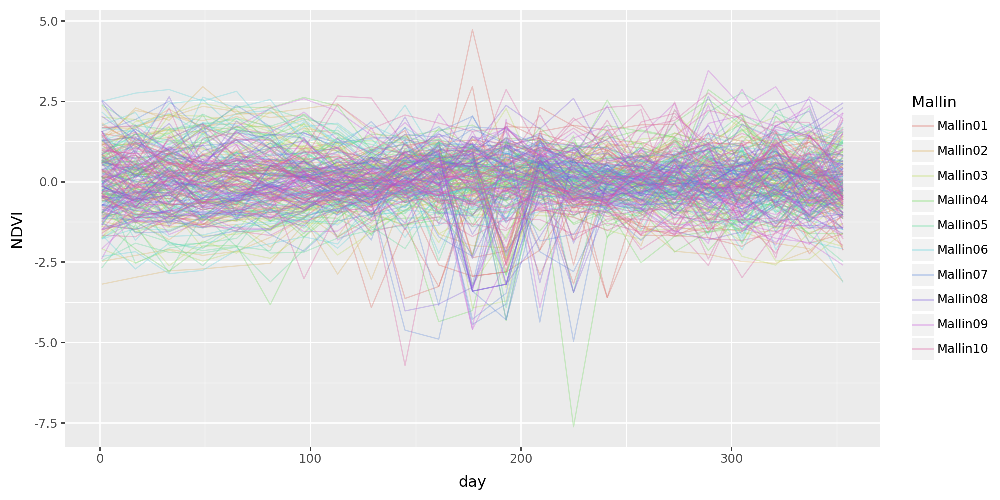

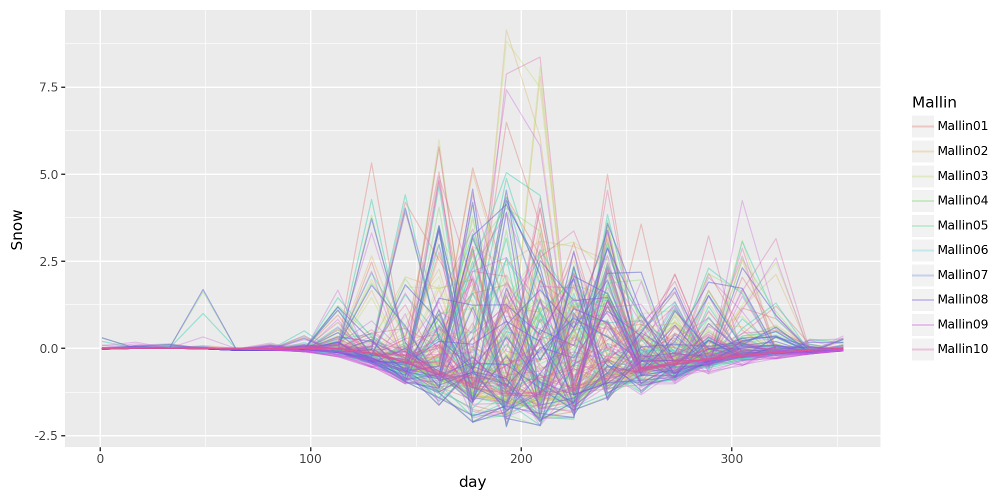

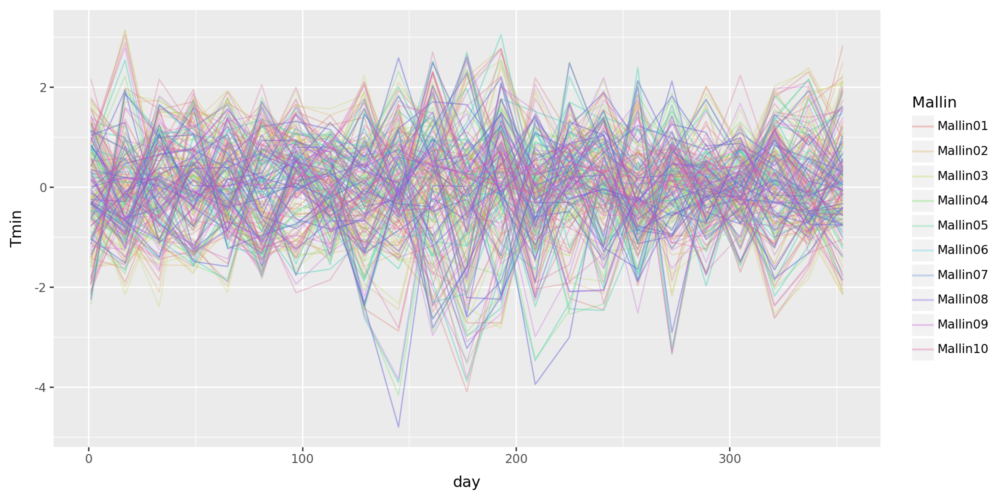

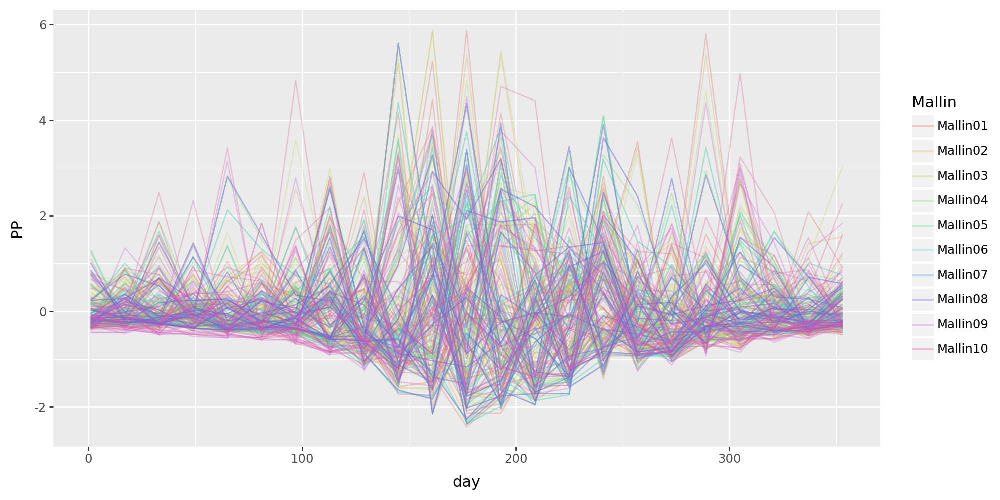

In [74]:
from mizani.breaks import date_breaks
from mizani.formatters import date_format

def interaction(*cats, sep="."):
    cats = [c.astype(str) for c in cats]
    return [sep.join(items) for items in zip(*cats)]

for y in ["NDVI","Snow","Tmin","PP"]:
    (gg.ggplot(df, gg.aes(x='day', y=y,color="Mallin",group="id"))
        + gg.geom_line(alpha=0.3)
        + gg.theme(figure_size=(10, 5))
    
    ).show()

  



# Correlation Matrix

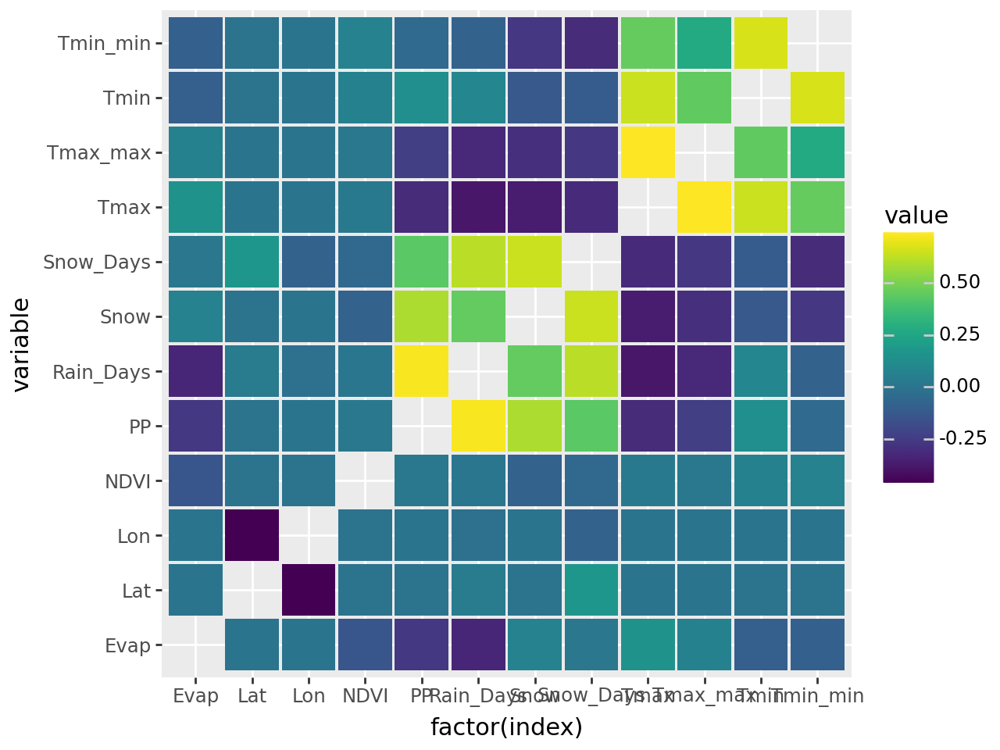

In [78]:
import polars as pl
import mizani.labels as ml


def corr_matrix(df:pl.DataFrame):
    
    return df.corr().with_columns(index = pl.lit(pl.Series(df.columns))).unpivot(index = "index").filter(pl.col("index") != pl.col("variable"))

corr_columns = ['Evap', 'NDVI', 'PP', 'Rain_Days', 'Snow', 'Snow_Days', 'Tmax', 'Tmax_max', 'Tmin', 'Tmin_min',"Lat","Lon"]

corr = corr_matrix(df.select(corr_columns))

(
    gg.ggplot(corr, gg.aes("factor(index)", "variable", fill="value"))
    + gg.geom_tile(gg.aes(width=0.95, height=0.95))
)


# Visually check if each Mallin has the same sampling pattern

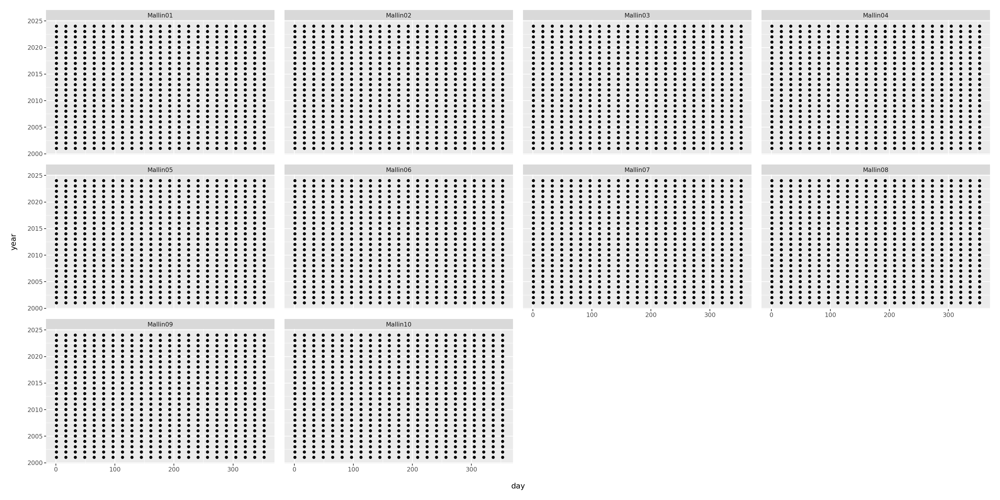

In [75]:
(gg.ggplot(df)
    +gg.geom_point(gg.aes(x='day', y="year",))
    #gg.geom_jitter(gg.aes(x='day', y="year", width="Mallin", height="Mallin", color="Mallin"))
    + gg.theme(figure_size=(20, 10))
    + gg.facet_wrap(facets="Mallin")
).show()

# Numerically check each Mallin has the same number of samples each year

In [79]:

lens = df.group_by(["Mallin","month","day"]).len().filter(pl.col("len")<24).sort(pl.col("Mallin"))
lens.transpose()

df.group_by(["Mallin","year"]).len().unique("len").drop(["Mallin","year"])

len
u32
23
